# schema11y

> all models are wrong, but some are useful

`schema11y` is a technique for creating accessible representations of data structures.
it relies on open standards including json schema, WAI-ARIA, WHATWG, and json-ld.
together these tools, representations, and specifications provide general data structures with context that will pass batteries of automated testing freeing up time for bespoke manual testing. ultimately, `schema11y` is an accessible starting point for web content.

## how does it work

> the only constant in computing is the fetch execute cycle

`schema11y` represents three nonvisual data structures ibn .  
`schema11y`'s vocabulary combines json schema and json-ld standards with new keys added for html and ARIA content. the challenge is to transform the json schema data structure into html that considers three nonvisual data strucutres:

1. the aria representation
2. the `form` respresentation
3. the microdata representation

`schema11y` uses schema to express the full shape of a data type. a schema, and its subschema, all represent one of the finite ARIA roles allowed in the HTML standard. Once, the aria role is defined, explicitly or implicitly, an appropriate html element is constructed using type information to property attribute to the problem html semnatics.

## significant benefits

`schema11y` works toward generic solutions be focusing on the type space rather than specific objects; the goal is to define the space that the data should be represented in.
using json schema can have significant downstream benefits. it defines the type space and as a result it can be used for:

* accessible html representations
* test generation
* type checking
* code generation
* REST applications, it is typically expected that schema don't change offering caching benefits.

### mitigate repetition

repetition is key in aria, but not in schema

### schema always has position

the `@id` and `@type` represent

an object or one of its elements will implicitly have one `output`,
and may have many potential input controls that could be chosen from
when applicators are used;.

## the json schema vocab

the modern json schema draft is composition of 7 subschema.
`schema11y` works through each layer of schema to progressively establish 
critical components of an accessible data structure.

1. the `core` subschema defines the `$` prefix for internal json schema terms in the vocabulary
    1. representing the output, a singular representation of complex types
        1. use `content` and `format` to determine the output representation of an object
    2. representing the evaluated and `unevaluated` input
        3. the `applicator` defines combinators for subschema that provide structure that to the representation.
        5. the `validator` defines terms that translate to ARIA and HTML attribrutes that ensure accessible outputs.
        6. `format` provides specific terms for validating types that may determine more specific aria roles.
        7. `metadata` provides important labelling and contextual information
        8. `unevaluated` is used 

## indexing complications

the applicators create indexing conflicts in the html representation when
we rely strictly on the `@id` of an object. `oneOf` and `allOf` introduce
conflicts that are resolved by including the type in the id

it is good if the identifiers are readable, but overall they ought to be opaque.

In [1]:
%%
```yaml
core: internal schema representation, defines input and output, writing and reading
applicator: combinators for types

```

{'core': 'internal schema representation, defines input and output, writing and reading',
 'applicator': 'combinators for types'}

core : internal schema representation, defines input and output, writing and reading 
 applicator : combinators for types

representing the visual and nonvisual structures:
1. the microdata/linked data

In [ ]:

there is always a position in the schema that can be associated with elemetns

In [2]:
import jsonpointer

In [4]:
jsonpointer.JsonPointer("/a/b").resolve()

['a', 'b']

In [1]:
import nbref.nb
from nbref import Schema
import nbref.htmls3
from nbref.htmls3 import html_render

In [2]:
data = Schema.Object.from_file(
    "/Users/tonyfast/antisocial/making.ipynb"
)

In [ ]:
data

In [17]:
d.get("properties", None, True)

TypeError: Dict.get() takes from 2 to 3 positional arguments but 4 were given

In [3]:
d = nbref.Schema.Dict.from_file("/Users/tonyfast/antisocial/making.ipynb")

In [4]:
nb = nbref.Schema(nbref.Schema.Notebook().schema.expand()).as_default(dict(d))
nb.root.set_name("nb");
d.root = nb.root

In [5]:
def add_output(schema, options=None, **attrs):
    
    cell = Schema.default(schema)
    cell["source"] = "".join(cell["source"])
    if cell["cell_type"] == "markdown":
        cell["outputs"] = cell.reflect(Schema.Array([dict(
            output_type="display_data", data={
                "text/markdown": cell["source"]
            }
        )]), "outputs")
    return schema.reflect(Schema(schema, properties=dict(source=dict(
        contentMediaType="text/plain"
    ))))
    return schema

In [6]:
nb.property("cells").property(0).pipe(add_output).property("outputs").property(0).property("data").property("text/markdown")

{
    "@value": "# making accessible technology using modern art techniques.\n\ni'm encouraging y'all to get into the work. spend time making something\nto activate your available senses. heightening these awarenesses helps \ncreate more _perceivable_ content, more accessible experiences.\n\n<figure>\n\n![](https://thirddrawerdown.co.uk/cdn/shop/products/Modern-Art-Tea-Towel_craig-Damrauer_TDDS.jpg?v=1648105998&width=1000)\n\n<figcaption>\n    <mark>modern art</mark> equals <mark>i could do that</mark> plus <mark>yea, but you didn't</mark>\n    <a href=\"https://assortedbitsofwisdom.com/\">craig damrauer</a>\n</figcaption>\n</figure>\n\nwe've demonstrated how modern art techniques can offer insight and engagement with a work.\nwe have access to all of art history, hell most of it is crammed in the browser, this places us at a unique time to make meaningful material and non-materials works.",
    "contentMediaType": "text/markdown",
    "@id": "#:@value:cells:0:outputs:0:data:text/markd

In [13]:
nb.property("cells").property(0).pipes(
    html_render, bs4.Tag.prettify, print, options=Schema.Options(
        schema_patch={
            "#:$defs:nb:properties:cells:items": add_output
        }
    ))

#:$defs:nb:properties:cells:items:properties:id
#:$defs:nb:properties:cells:items:properties:execution_count
#:$defs:nb:properties:cells:items:properties:cell_type
#:properties:source
#:$defs:nb:properties:cells:items:properties:outputs:items:properties:output_type
#:$defs:mimetypes:properties:text/markdown
#:$defs:nb:properties:cells:items:properties:outputs:items:properties:data
#:$defs:nb:properties:cells:items:properties:outputs
#:$defs:metadata:properties:title
#:$defs:metadata:properties:description
#:$defs:metadata:properties:authors
#:$defs:metadata:properties:created
#:$defs:metadata:properties:modified
#:properties:metadata
<details open="">
 <summary>
  <span class="title">
   cell
  </span>
  <span class="key">
   parent
  </span>
 </summary>
 <output class="read">
 </output>
 <ul class="object items" id="#:@value:cells:0">
  <li class="item id">
   <a class="anchor" href="##:@value:cells:0:id" id="#:@value:cells:0:id">
    <span class="title">
    </span>
    <span class="

In [8]:
%%

    import jsonschema
    settings = Schema(
```yaml
$id: https://deathbeds.github.io/nbref/settings
"@id": settings
title: settings
type: object
description: update how the document looks, sounds, and feels.
$anchor: settings
properties:
    color:
        title: color settings
        description: change the foreground and background colors
        properties:
            theme: 
                description: update the color theme
                type: string
                default: system
                enum: [light, dark, system]
                $ref: "#/$defs/toggleClassHTML"
            background:
                title: background image
                description: show the background image
                type: boolean
                default: true
            filters:
                title: color filters
                properties: 
                    invert:                        
                        type: boolean
                        $ref: "#/$defs/toggleClassHTML"
                    gray:
                        type: boolean
                        $ref: "#/$defs/toggleClassHTML"

    typography:
        title: typography
        # role: details
        properties: 
            font-size:
                enum: [medium]
                default: medium
            font:
                title: prefer the system font
                default: false
                type: boolean
                $comment: the default font is atkinson hyperlegible
            document:
                title: modify the document layout
                properties:
                    margin:
                        type: number
                        minimum: 0
                        default: 5
                        dependentSchemas:
                            margin-unit: 
                                default: em
                                $ref: "#/$defs/css:length"
                        unit:
                            default: em
                            
                    width:
                        title: document width
                        default: fit
                        oneOf:
                            - type: string
                              enum: [fit, wide]
                              $ref: "#/$defs/toggleClassHTML"
                            - title: custom
                              type: number
                              default: 100
                              aria:
                                controls: HTML
                              "on":
                                change: setStyleProperty(event)
                              data:
                                key: margin
                              dependentSchemas:
                                  unit:
                                    $ref: "#/$defs/css:length"
            custom:
                title: custom styles
                type: array
                additionalItems:
                    properties:
                        style:
                            type: string
                            oneOf:
                            - title: url
                              type: string
                              format: uri
                            - title: css
                              type: string
                              format: textarea
                              contentSchema:
                                  contentMediaType: text/css
                        visible:
                            type: boolean
                            default: true
                                                    
            # spacing:
            #     title: 
            #     properties:
            #         letter:
                        
    # at:
    #     title: assistive technology
    # properties: {}
$defs:
    toggleClassHTML: 
        aria:
            controls: HTML
        "on":
            change: toggleClass(event)
    css:length:
        type: string
        default: "%"
        enum: [em, "%"]
parent: 
    role: dialog
    aria:
        expanded: no
``` 
    )


In [9]:
s = settings.as_default().insert(0, dict(parent=dict(role="group")))

In [10]:
import bs4

In [11]:
settings.as_default().insert(0, dict(parent=dict(aria=dict(expanded=True)))).pipes(
    nbref.htmls3.html_render, bs4.Tag.prettify, print
)

#:properties:color:properties:theme
settings:properties:color:properties:background
#:properties:color:properties:filters:properties:invert
#:properties:color:properties:filters:properties:gray
settings:properties:color:properties:filters
settings:properties:color
settings:properties:typography:properties:font-size
settings:properties:typography:properties:font
settings:properties:typography:properties:document:properties:margin
settings:properties:typography:properties:document:properties:width
settings:properties:typography:properties:document
settings:properties:typography:properties:custom
settings:properties:typography
<section aria-expanded="true">
 <output class="read">
 </output>
 <ul class="object items #" id="settings">
  <li class="item color">
   <a class="anchor" href="##:@value:color" id="#:@value:color">
    <span class="title">
     color settings
    </span>
    <span class="key">
     color
    </span>
   </a>
   <output class="read">
   </output>
   <ul class="object

In [11]:

s.as_default()["@value"]["typography"]["document"]["margin"].pipe(Schema.id)

'#:@value:typography:document:margin'

literally a node in the graph
literarilly a node in the graph

In [6]:
data.set_schema(Schema(title="track")).schema

{
    "title": "track"
}

In [7]:
Schema().expand(dict(a=10)).property("a")

22 None


{
    "@id": "#:default:a",
    "@type": "#:additionalProperties",
    "default": 10
}

In [1]:
(s := Schema(type="integer", default=9, maximum=10, readOnly=False, parent=dict(
        role="dialog", aria=dict(expanded=True))
)).pipes(nbref.htmls3.html_render, str,HTML)

NameError: name 'Schema' is not defined

In [10]:
Schema(
    default=[12, 13], readonly=True
).pipes(nbref.htmls3.html_render,str, HTML)

22 None
22 None


In [ ]:
Schema().as_default([
    dict(message=e.message)
    for e in  s.validate(raises=False)
])

try:
    (s := Schema(type="integer", default=11.1, maximum=0, parent=dict(
        role="dialog", aria=dict(expanded=True))
    )).pipes(
        nbref.htmls3.html_render, str, HTML
    )
except Ba as e:
    E = e

In [ ]:
try:
    (s := Schema(type="integer", default=11.1, maximum=0, parent=dict(
        role="dialog", aria=dict(expanded=True))
    )).pipes(
        nbref.htmls3.html_render, str, HTML
    )
    s.validate()
except BaseException as e:
    print("fail")
    E = e

In [ ]:
e = E.exceptions[0]

{'message': '11.1 is not of type integer',
 'type': jsonschema.exceptions.ValidationError}

In [ ]:
s.validate()

In [30]:
%%

    import jsonschema
    settings = Schema(
```yaml
$id: https://deathbeds.github.io/nbref/settings
"@id": settings
title: settings
type: object
description: update how the document looks, sounds, and feels.
$anchor: settings
properties:
    color:
        title: color settings
        description: change the foreground and background colors
        properties:
            theme: 
                description: update the color theme
                type: string
                default: system
                enum: [light, dark, system]
                $ref: "#/$defs/toggleClassHTML"
            background:
                title: background image
                description: show the background image
                type: boolean
                default: true
            filters:
                title: color filters
                properties: 
                    invert:                        
                        type: boolean
                        $ref: "#/$defs/toggleClassHTML"
                    gray:
                        type: boolean
                        $ref: "#/$defs/toggleClassHTML"

    typography:
        title: typography
        # role: details
        properties: 
            font-size:
                enum: [medium]
                default: medium
            font:
                title: prefer the system font
                default: false
                type: boolean
                $comment: the default font is atkinson hyperlegible
            document:
                title: modify the document layout
                properties:
                    margin:
                        type: number
                        minimum: 0
                        default: 5
                        dependentSchemas:
                            margin-unit: 
                                default: em
                                $ref: "#/$defs/css:length"
                        unit:
                            default: em
                            
                    width:
                        title: document width
                        default: fit
                        oneOf:
                            - type: string
                              enum: [fit, wide]
                              $ref: "#/$defs/toggleClassHTML"
                            - title: custom
                              type: number
                              default: 100
                              aria:
                                controls: HTML
                              "on":
                                change: setStyleProperty(event)
                              data:
                                key: margin
                              dependentSchemas:
                                  unit:
                                    $ref: "#/$defs/css:length"
            custom:
                title: custom styles
                type: array
                additionalItems:
                    properties:
                        style:
                            type: string
                            oneOf:
                            - title: url
                              type: string
                              format: uri
                            - title: css
                              type: string
                              format: textarea
                              contentSchema:
                                  contentMediaType: text/css
                        visible:
                            type: boolean
                            default: true
                                                    
            # spacing:
            #     title: 
            #     properties:
            #         letter:
                        
    # at:
    #     title: assistive technology
    # properties: {}
$defs:
    toggleClassHTML: 
        aria:
            controls: HTML
        "on":
            change: toggleClass(event)
    css:length:
        type: string
        default: "%"
        enum: [em, "%"]
parent: 
    role: dialog
    aria:
        expanded: no
``` 
    )


In [34]:
s = settings.as_default().insert(0, dict(parent=dict(role="group")))

In [52]:
s.property("color").property("background")["default"].id()

'settings:properties:color:properties:background:default'

In [33]:
settings.as_default().insert(0, dict(parent=dict(role="group"))).pipes(
        nbref.htmls3.html_render, str
    )

  + Exception Group Traceback (most recent call last):
  |   File "/Users/tonyfast/.pixi/envs/default/lib/python3.14/site-packages/nbref/htmls3.py", line 112, in html_one_of
  |     options.el(item, html_validation(subschema.reflect(Schema(subschema, schema)), options, **attrs))
  |     ~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  |   File "/Users/tonyfast/.pixi/envs/default/lib/python3.14/site-packages/nbref/utils.py", line 122, in el
  |     el(tag, *object)
  |     ~~^^^^^^^^^^^^^^
  |   File "/Users/tonyfast/.pixi/envs/default/lib/python3.14/site-packages/nbref/htmls3.py", line 156, in html_validation
  |     Schema.validate(schema)
  |     ~~~~~~~~~~~~~~~^^^^^^^^
  |   File "/Users/tonyfast/.pixi/envs/default/lib/python3.14/site-packages/nbref/schemas.py", line 550, in validate
  |     raise ValidationErrors(object.id(), errors)
  | nbref.schemas.ValidationErrors: settings:properties:color:properties:background:default (1 sub-

In [4]:
d = nbref.Schema.Dict.from_file("/Users/tonyfast/antisocial/making.ipynb")

In [5]:
nb = nbref.Schema(nbref.Schema.Notebook().schema.expand()).as_default(dict(d))

In [5]:
E

nbref.schemas.ValidationErrors('None:default',
                               [<ValidationError: '11.1 is not of type integer'>,
                                <ValidationError: '11.1 is greater than the maximum of 0'>])

In [12]:
import jsonschema

In [15]:
import exceptiongroup

In [ ]:
Schema.errors()

In [16]:
exceptiongroup.ExceptionGroup("validation failed", )

<module 'exceptiongroup' from '/Users/tonyfast/.pixi/envs/default/lib/python3.14/site-packages/exceptiongroup/__init__.py'>

In [14]:
import asyncio

In [ ]:
asyncio.G

In [13]:
jsonschema.Draft202012Validator.validate??

Signature: jsonschema.Draft202012Validator.validate(self, *args, **kwargs)
Docstring: <no docstring>
Source:   
        def validate(self, *args, **kwargs):
            for error in self.iter_errors(*args, **kwargs):
                raise error
File:      ~/.pixi/envs/default/lib/python3.14/site-packages/jsonschema/validators.py
Type:      function

11 #:default:cells:0:source None:default:cells:0:source
11 #:default:cells:1:source None:default:cells:1:source
11 #:default:cells:2:source None:default:cells:2:source
11 #:default:cells:3:source None:default:cells:3:source
11 #:default:cells:4:source None:default:cells:4:source
11 #:default:cells:5:source None:default:cells:5:source
11 #:default:cells:6:source None:default:cells:6:source
11 #:default:cells:7:source None:default:cells:7:source
11 #:default:cells:8:source None:default:cells:8:source
11 #:default:cells:9:source None:default:cells:9:source
11 #:default:cells:10:source None:default:cells:10:source
11 #:default:cells:11:source None:default:cells:11:source
11 #:default:cells:12:source None:default:cells:12:source
11 #:default:cells:13:source None:default:cells:13:source
11 #:default:cells:14:source None:default:cells:14:source
11 #:default:cells:15:source None:default:cells:15:source
11 #:default:cells:16:source None:default:cells:16:source
11 #:default:cells:17:source None:


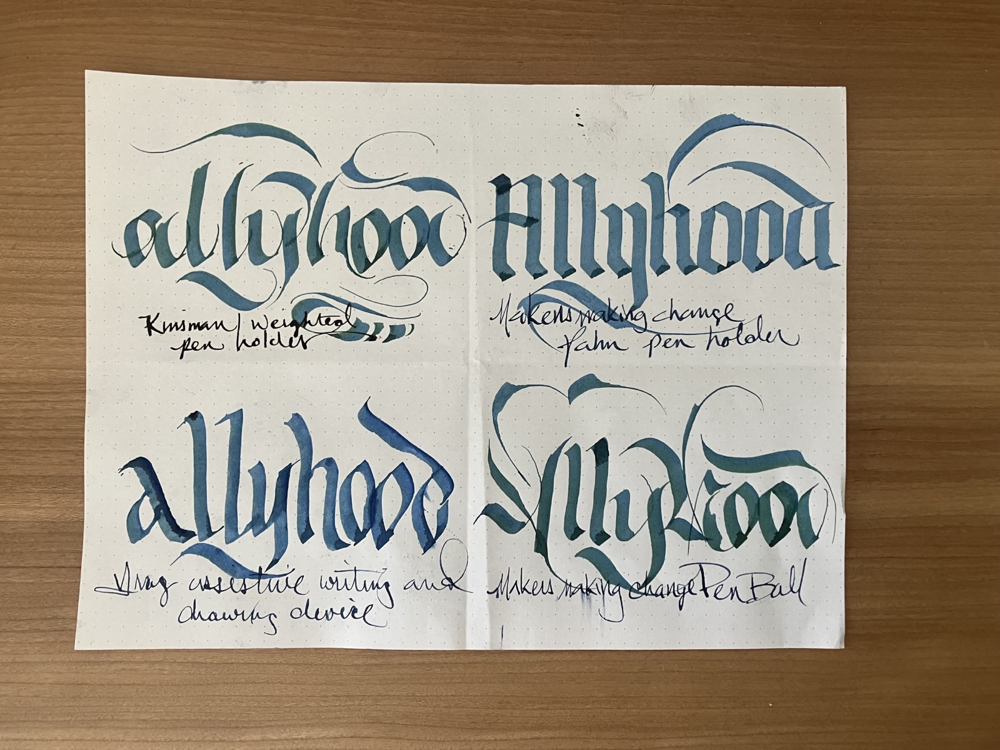
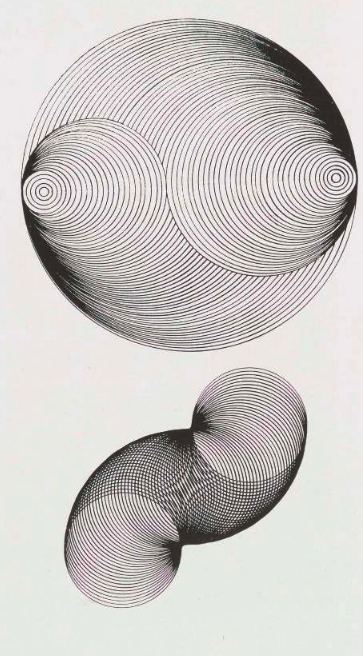
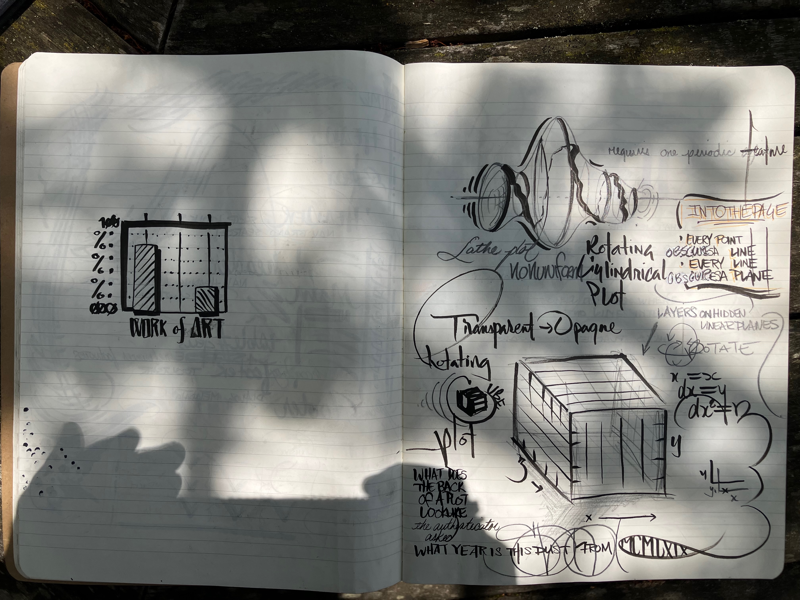
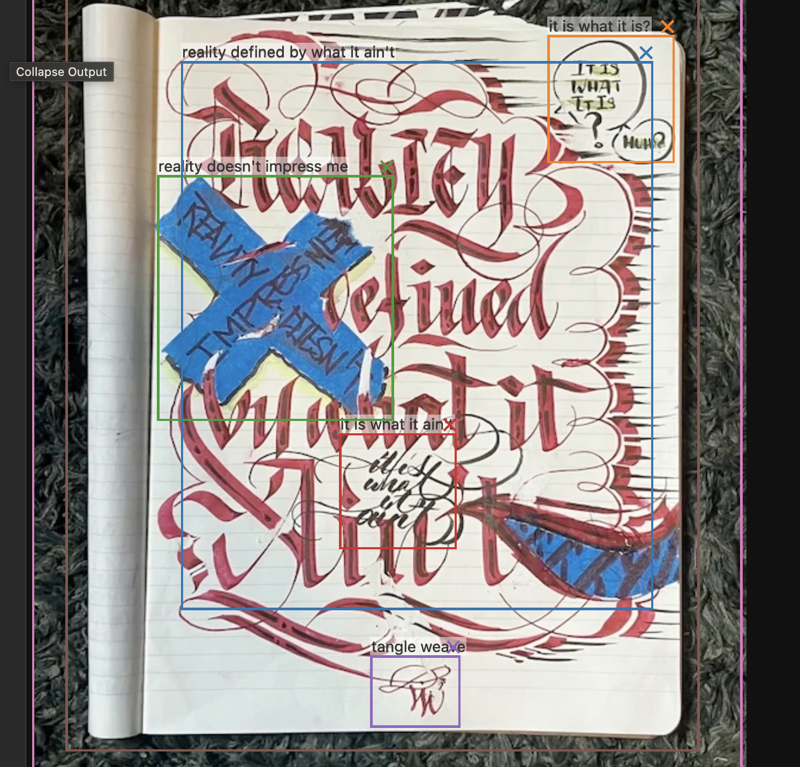
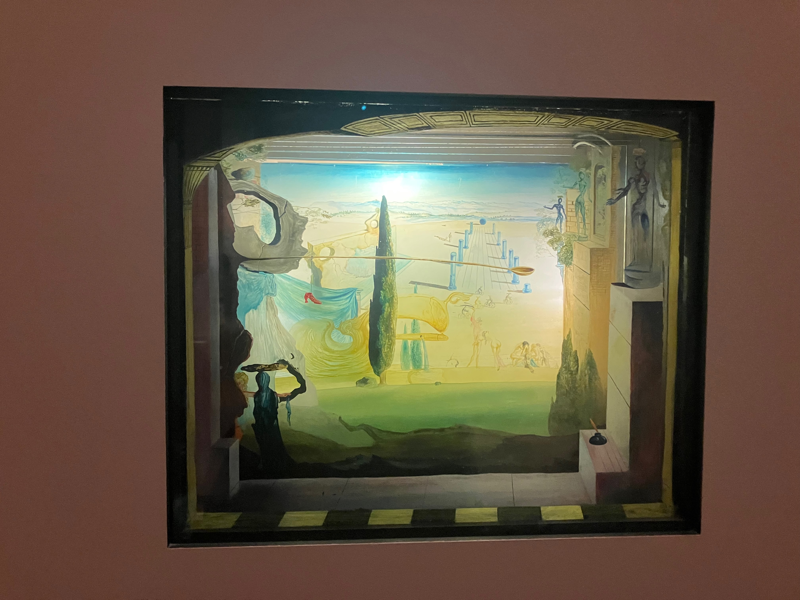
...
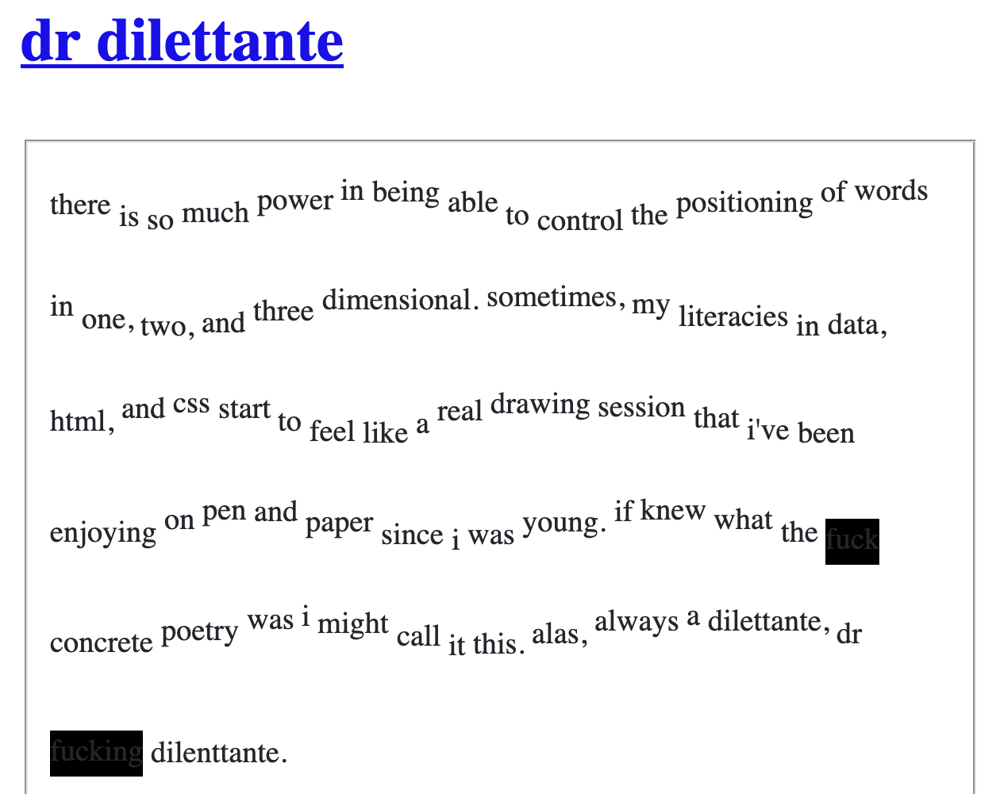
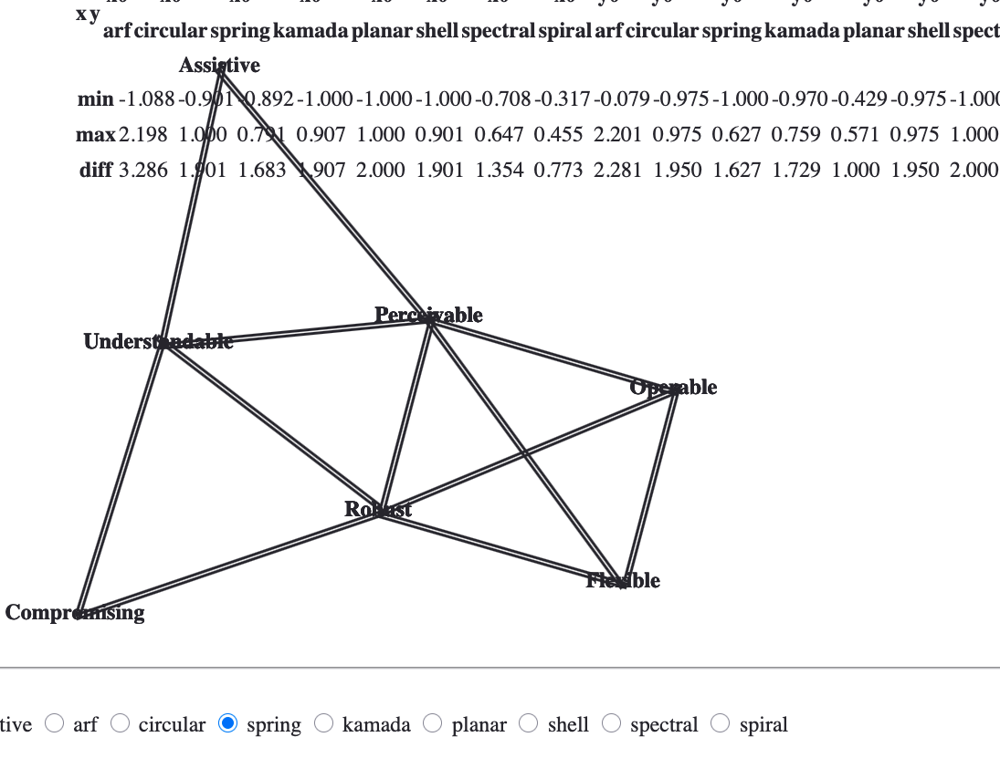
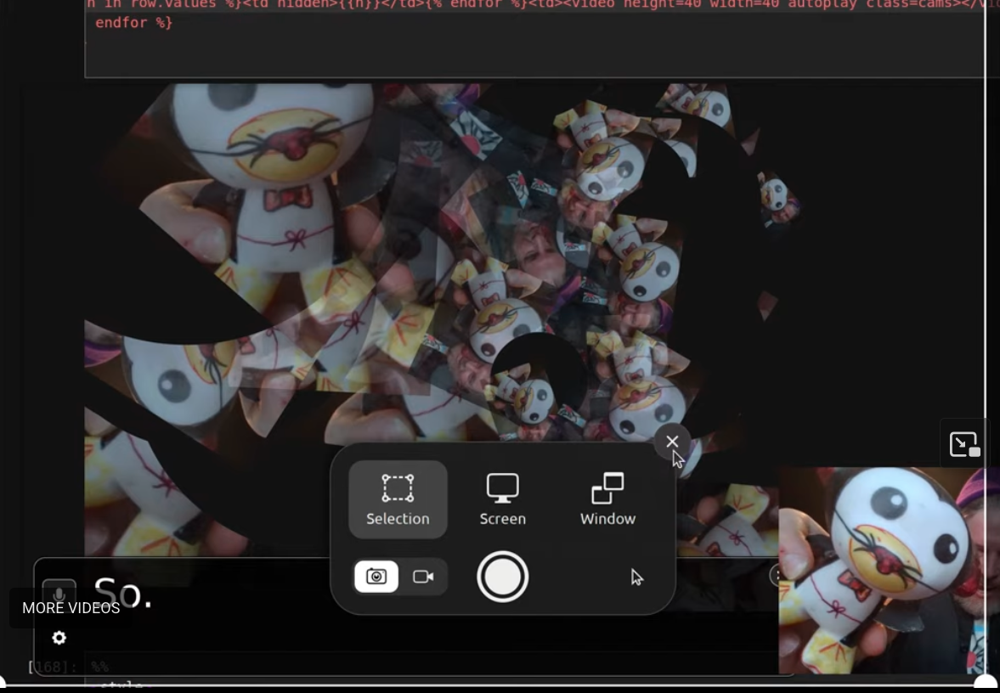
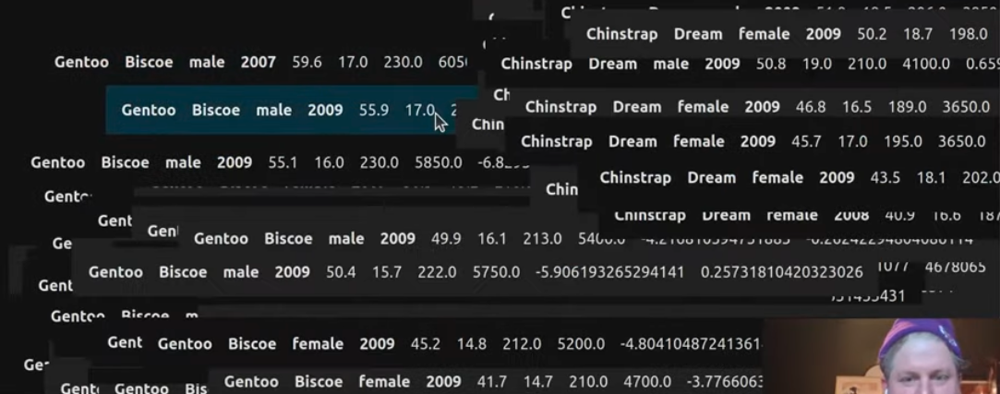
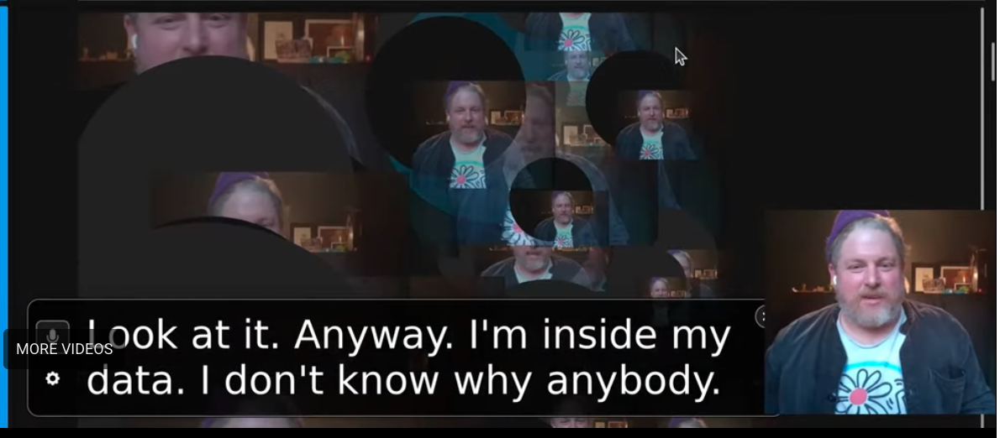

In [4]:
nb.pipes(nbref.htmls3.html_render, str, HTML)

In [5]:
nb.property("cells").property(8).append(parent = dict(role="main")).pipes(nbref.htmls3.html_render)

11 #:default:cells:8:source None:default:cells:8:source
details
details


<div><span class="title">cell</span><span class="key">9</span><ul class="object items"><li class="item id"><a class="anchor" href="#None:default:cells:8:id" id="None:default:cells:8:id"><span class="title"></span><span class="key">id</span></a><label for="None:default:cells:8:id"><span class="title"></span><span class="key">id</span></label><input id="#:$defs:nb:properties:cells:items:properties:id:default" type="text" value="fab318a2-b514-464c-b284-deaf4828a6dc"></input></li><li class="item execution_count"><a class="anchor" href="#None:$defs:nb:properties:cells:items:properties:execution_count:default" id="None:$defs:nb:properties:cells:items:properties:execution_count:default"><span class="title">execution count</span><span class="key">default</span></a><label for="None:$defs:nb:properties:cells:items:properties:execution_count:default" id="None:$defs:nb:properties:cells:items:properties:execution_count:default" value="-1"><span class="title">execution count</span><span class="key">

nb.property("cells").property(8).pipe(nbref.htmls3.html_render)

nb.property("cells").property(4).property("attachments").property(
    "f991cfc6-1b9b-4a98-94aa-548fc3b0a9ea.png"
).property("image/png").pipes(nbref.htmls3.html_render, str)

nb["default"]["metadata"]["kernelspec"].id()

nb.pipes(nbref.htmls3.html_render, str, HTML)

nb.property("cells").property(1).property("source").pipes(nbref.htmls3.html_render, str, HTML)

HTML(str(nbref.htmls3.html_render(nb)))

s = nbref.Schema(type="string array".split()).as_default([10, 2, 3])

def html_disabled() -> True:
    pass

def html_disabled() -> True:
    pass

class O:
    object: object
    disabled: bool = True
    labels: list = None
    descriptions: list = None
    details: list = None
    errors: list = None
    owns: list = None
    controls: list = None

from nbref.nb import Schema
from pandas import Series, DataFrame
import referencing, jsonschema_specifications
# referencing.jsonschema.bool = nbref.objects.Boolean
import nbref
from nbref.utils import el

d = Schema(type="array")([1, 2])

Schema(dict(type="array", default=d))["default"][1]

nb = Schema.Notebook.from_file("/Users/tonyfast/antisocial/making.ipynb")

In [6]:
Schema(type="integer", default=11.1, maximum=0).pipe(nbref.htmls3.html_render)

no {
    "default": 11.1
}


<ol class="oneof"><li><label for="None:default" id="None:default" value="11.1"><span class="title"></span><span class="key">default</span></label><input id="None:default" type="number" value="11.1"></input></li><li><label for="None" id="None" value="0"><span class="title"></span><span class="key">#</span></label><input id="None" type="number" value="0"></input></li></ol>

(~Schema()).append(type="string", title="string")(100).html()

Schema(type="integer", maximum=0)(10.1).html()

main = Schema.Notebook.from_file(
    "/Users/tonyfast/antisocial/making.ipynb"
).set_name("nb")

document = main.render_bs4(None, el("style", """
summary.cells,
ol.array:not(.cells)>li>a>span.key,
summary.nav span.key,
summary:not(.nav) span.title,
a span.title,
span.type,
details.source>summary,
details.outputs>summary,
li.cell.markdown>ul.cell>li.source,
ol.outputs>li.output>ul.output>li:not(.data, .text, .ename),
ul.cell>li:not(.source, .outputs) { 
    display: none;
}
ol.array, ul.object {
    &>li {list-style: none;}
}
"""))

HTML(str(document))

is default losing the schema?

%%

    header = Schema(
```yaml
type: array
style:
    display: flex
    flex-direction: row
parent:
    role: banner
    aria: no
prefixItems:
-   role: link
    tags: [skip, nv]
    default: skip to top
    attrs:
        href: "#TOP"
-   role: link
    tags: [skip, nv]
    default: skip to bottom
    attrs:
        href: "#BOTTOM"
-   role: img
    type: string
    parent:
        role: link
        type: string
        attrs:
            href: "#"
            title: tonyfast's jawn
    attrs:
        src: https://avatars.githubusercontent.com/u/4236275?v=4
        style:
            height: 64px;
-   role: button
    default: settings
    tags: [nv]
    on:
        click: event.target.ariaControls.forEach((object)=>object.showModal())
    aria:
        controls: settings:dialog
```
        )().set_name("header")

    header.html()

%%

```css
span.type, a.anchor {
    display: none;
}
ul.object>li, ol.array>li {
    list-style: none;
}
.nv, .sr-only, .visually-hidden {
    clip: rect(0 0 0 0);
    clip-path: inset(50%);
    height: 1px;
    overflow: hidden;
    position: absolute;
    white-space: nowrap;
    width: 1px;
}
```

%%

    import jsonschema
    settings = Schema(
```yaml
$id: https://deathbeds.github.io/nbref/settings
title: settings
type: object
description: update how the document looks, sounds, and feels.
$anchor: settings
properties:
    color:
        title: color settings
        description: change the foreground and background colors
        properties:
            theme: 
                description: update the color theme
                type: string
                default: system
                enum: [light, dark, system]
                $ref: "#/$defs/toggleClassHTML"
            background:
                title: background image
                description: show the background image
                type: boolean
                default: true
            filters:
                title: color filters
                properties: 
                    invert:                        
                        type: boolean
                        $ref: "#/$defs/toggleClassHTML"
                    gray:
                        type: boolean
                        $ref: "#/$defs/toggleClassHTML"

    typography:
        title: typography
        # role: details
        properties: 
            font-size:
                enum: [medium]
            font:
                title: prefer the system font
                default: false
                type: boolean
                $comment: the default font is atkinson hyperlegible
            document:
                title: modify the document layout
                properties:
                    margin:
                        type: number
                        minimum: 0
                        default: 5
                        dependentSchemas:
                            margin-unit: 
                                default: em
                                $ref: "#/$defs/css:length"
                        unit:
                            default: em
                            
                    width:
                        title: document width
                        default: fit
                        oneOf:
                            - type: string
                              enum: [fit, wide]
                              $ref: "#/$defs/toggleClassHTML"
                            - title: custom
                              type: number
                              default: 100
                              aria:
                                controls: HTML
                              "on":
                                change: setStyleProperty(event)
                              data:
                                key: margin
                              dependentSchemas:
                                  unit:
                                    $ref: "#/$defs/css:length"
            custom:
                title: custom styles
                type: array
                additionalItems:
                    properties:
                        style:
                            type: string
                            oneOf:
                            - title: url
                              type: string
                              format: uri
                            - title: css
                              type: string
                              format: textarea
                              contentSchema:
                                  contentMediaType: text/css
                        visible:
                            type: boolean
                            default: true
                                                    
            # spacing:
            #     title: 
            #     properties:
            #         letter:
                        
    # at:
    #     title: assistive technology
    # properties: {}
$defs:
    toggleClassHTML: 
        aria:
            controls: HTML
        "on":
            change: toggleClass(event)
    css:length:
        type: string
        default: "%"
        enum: [em, "%"]
parent: 
    role: dialog
    aria:
        expanded: no
``` 
    )
    settings = Schema(settings.expand())()
    settings.html()

nb.schema

raw_nb = Schema.Notebook(cells=[
    dict(cell_type="raw",
         source="""file://~/tonyfast/tonyfast/xxv/2025-10-28-stream.ipynb
file:///Users/tonyfast/antisocial/making.ipynb
         """,
    )
])

raw_nb.html()